In [1]:
import os
os.environ['R_HOME'] = os.getenv("CONDA_PREFIX")+"/envs/muscle/lib/R/"
import anndata2ri
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from functools import reduce
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import rcParams
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.set_figure_params(dpi_save=600,dpi=50)
anndata2ri.activate()
%load_ext rpy2.ipython

In [2]:
%%R -o adata
load("adata_combined.RData")

In [3]:
adata.var['mt'] = adata.var_names.str.startswith('mt-') 

In [4]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [5]:
adata.obs.pct_counts_mt

hard_GTTAGACAGTAGCTCT-1    2.376233
hard_GGTGGCTGTCGTCGGT-1    4.161445
hard_CGTTAGACATTGACCA-1    2.410731
hard_CTGCAGGCACTTGAGT-1    2.366285
hard_CTGGACGTCTGGCTGG-1    2.592873
                             ...   
soft_ACTTAGGTCAGACCTA-1    5.724508
soft_TTGGGATCACGGCTAC-1    3.051059
soft_GAGGCCTGTCGAATGG-1    4.833647
soft_AAGCGTTAGGGCAGTT-1    3.072812
soft_GCATTAGCAAGGGTCA-1    7.810219
Name: pct_counts_mt, Length: 3829, dtype: float32

In [6]:
palette=["#8DD3C7","#FFFFB3","#BEBADA","#FB8072","#80B1D3","#FDB462","#B3DE69","#FCCDE5","#D9D9D9"]

/home/lfaure/miniconda3/envs/muscle/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


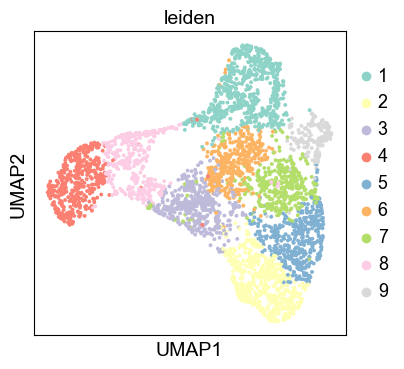

In [7]:
sc.pl.umap(adata,color="leiden",palette=palette)

/home/lfaure/miniconda3/envs/muscle/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/lfaure/miniconda3/envs/muscle/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/lfaure/miniconda3/envs/muscle/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


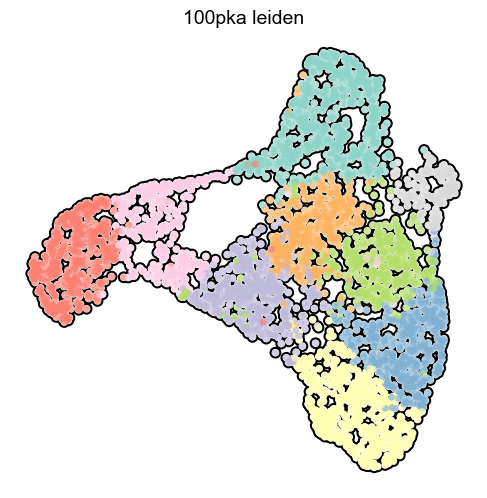

In [8]:
sc.set_figure_params(figsize=(6,6),dpi=50,dpi_save=600)
sc.pl.umap(adata, color='leiden', add_outline=True, legend_loc='none',
           legend_fontsize=12, legend_fontoutline=2,frameon=False,size =100,
           title='100pka leiden')

/home/lfaure/miniconda3/envs/muscle/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/lfaure/miniconda3/envs/muscle/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/lfaure/miniconda3/envs/muscle/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


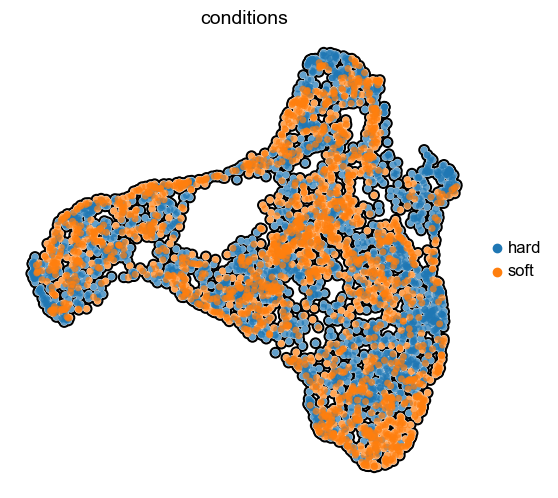

In [9]:
sc.pl.umap(adata, color='condition', add_outline=True,
           legend_fontsize=12, legend_fontoutline=2,frameon=False,size =100,
           title='conditions')

In [10]:
adata.obs=pd.concat([adata.obs,pd.read_csv("data/GO_terms.csv",index_col=0)],axis=1)

In [11]:
from matplotlib.colors import LinearSegmentedColormap
cm=LinearSegmentedColormap.from_list("cm",["darkgreen","lightgrey","darkorange"])

In [12]:
aspect=pd.read_csv("data/GO_terms.csv",index_col=0).columns[0]
v=np.min([adata.obs[aspect].abs().max(),-adata.obs[aspect].min()])

In [13]:
aspect

'positive regulation of Rho protein signal transduction'

In [14]:
import scvelo as scv

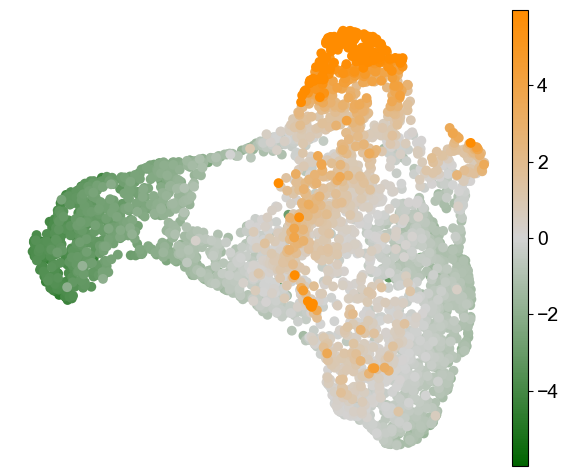

In [15]:
sc.set_figure_params(frameon=False,dpi_save=600,dpi=50,figsize=(7,6))
sc.pl.umap(adata,color=aspect,size=200,color_map=cm,title="",vmin=-v,vmax=v)

In [16]:
sc.pp.filter_genes(adata,min_cells=3)

In [17]:
sc.pp.normalize_total(adata, target_sum=1e4)

In [18]:
sc.pp.log1p(adata,base=10)

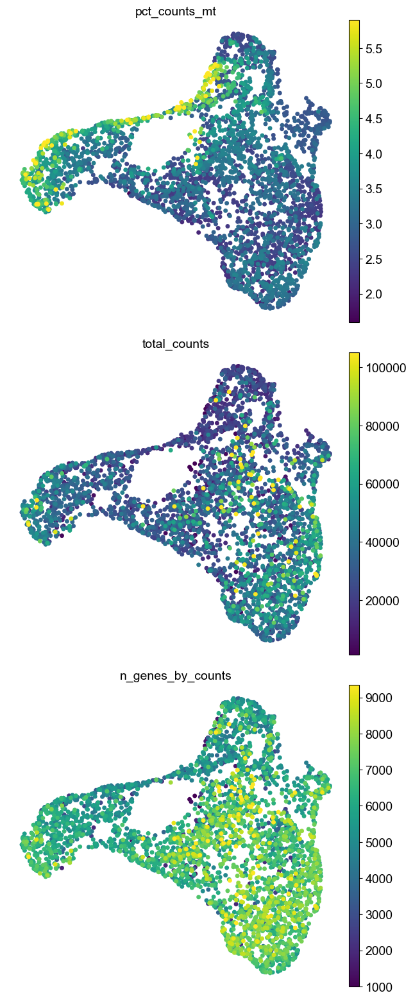

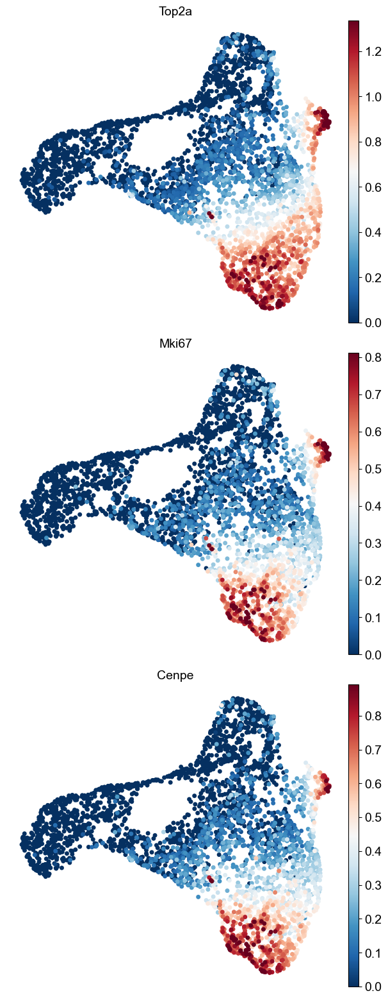

In [19]:
sc.pl.umap(adata,color=["pct_counts_mt","total_counts","n_genes_by_counts"],vmax="p99",size =100,wspace=0.05,hspace=0.1,ncols=1)

genes=["Top2a","Mki67","Cenpe"]
ax=sc.pl.umap(adata,color=genes,color_map="RdBu_r",vmax="p99",size=100,show=False,wspace=0.05,hspace=0.1,ncols=1)
for i in range(len(ax)):
    ax[i].set(xlabel="",ylabel="")

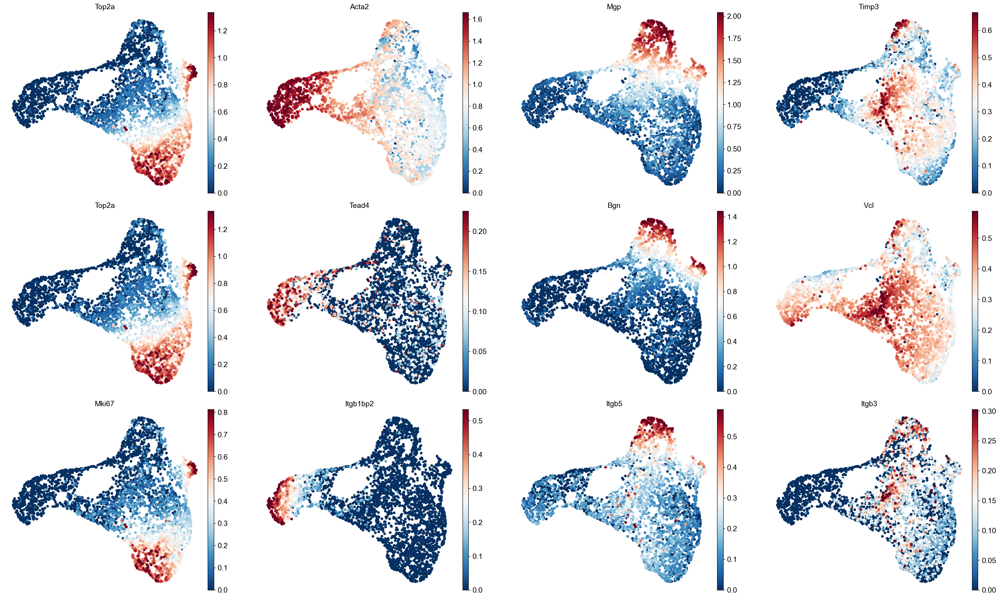

In [20]:
genes=["Top2a","Acta2", "Mgp", "Timp3",
       "Top2a","Tead4","Bgn","Vcl",
       "Mki67","Itgb1bp2","Itgb5","Itgb3"]

ax=sc.pl.umap(adata,color=genes,color_map="RdBu_r",vmax="p99",size=100,show=False,wspace=0.15,hspace=0.1,ncols=4)
for i in range(len(ax)):
    ax[i].set(xlabel="",ylabel="")

plt.savefig("figures/9_markers.png",dpi=600)

In [21]:
genes=["Mapk8","Mapk9","Mapk4","Mapk7",
       "Map4k4","Tac1","Map3k1","Map3k2",
       "Map3k3","Map3k4","Map3k10","Map3k11",
       "Map3k12","Map3k8","Taok1","Taok2",
      "Rac1","Cdc42","Pik3ca","Mst1",
       "Cdkn1a","Ptk2","Src","Pxn",
      "Rock1","Rock2","Mylk","Mylk2",
       "Mylk3","Rho","Vcl","Cfl1",
       "Cfl2","Limk1","Limk2","Yap1",
       "Taz","Tead1","Tead2","Tead3",
       "Tead4","Prkaca"]

In [22]:
Itg=adata.var_names[adata.var_names.str.startswith('Itg')]

In [23]:
genes=genes+Itg.tolist()

In [24]:
genes=pd.DataFrame(adata[:,genes].X.A,index=adata.obs_names,columns=genes).corr().loc["Cfl2"].sort_values().index

In [25]:
def plot_violin(gene):
    plt.rcParams['figure.figsize'] = 3,3
    topl=pd.DataFrame({"gene":gene,"fpm":adata[:,gene].X.A.flatten(),"sel":adata.obs.condition.values})
    ax=sns.violinplot(x="gene",hue="sel",y="fpm",data=topl,split=True, scale= 'width')
    ax.legend_.remove()
    ax.set_xlabel('')
    ax.set_ylabel('log10(FPM)')
    plt.savefig("figures/violins/_"+gene+".png",bbox_inches='tight')
    plt.clf()
    

In [26]:
#list(map(plot_violin,genes))

In [27]:
import seaborn as sns
gene=genes[0]


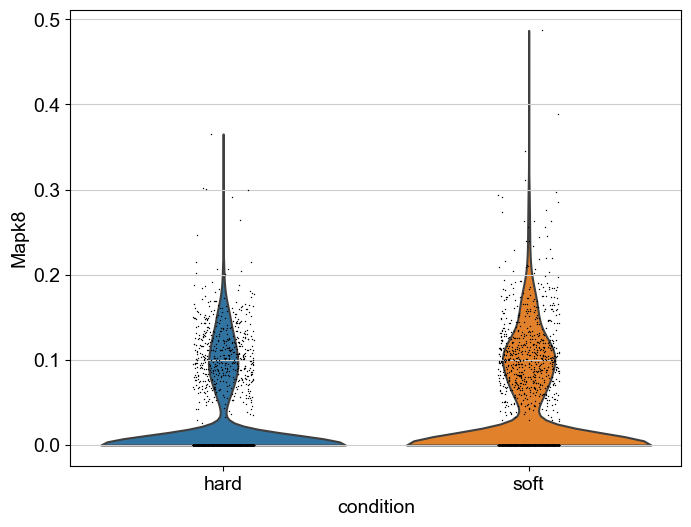

In [28]:
sc.pl.violin(adata,"Mapk8", groupby="condition",split=True)

In [29]:
genes=genes[~genes.isin(["Mylk3","Itgam","Itga8","Rho","Tac1","Itgal","Itgax","Itga2","Itgam.1","Mst1","Itga11","Itgb2","Itgae"])]

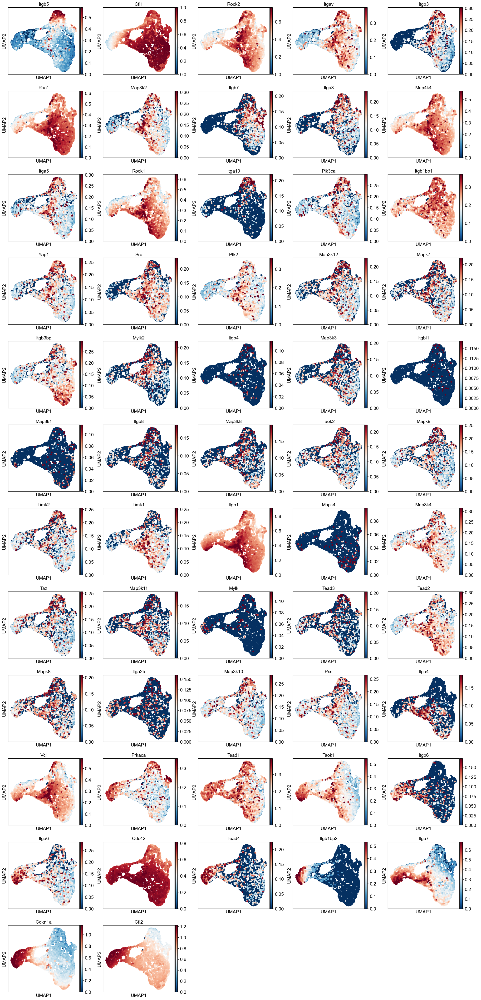

In [30]:
sc.set_figure_params(dpi_save=150,dpi=50)
sc.pl.umap(adata,color=genes,color_map="RdBu_r",vmax="p99",size=100,ncols=5,save="markers.png")

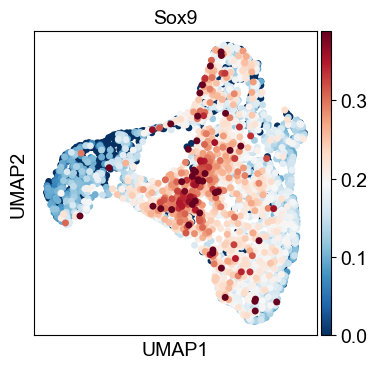

In [31]:
sc.pl.umap(adata,color="Sox9",color_map="RdBu_r",size=100,vmax="p99")

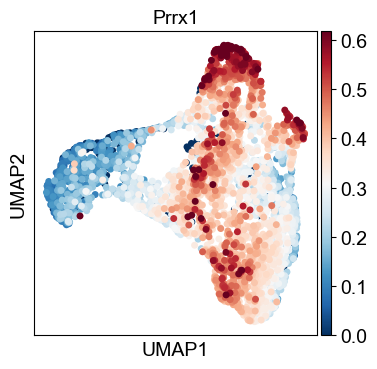

In [32]:
sc.pl.umap(adata,color="Prrx1",color_map="RdBu_r",size=100,vmax="p99")

In [33]:
import matplotlib.pyplot as plt

(array([1379., 1737.,  601.,   84.,    8.,    6.,    5.,    5.,    2.,
           2.]),
 array([0.        , 0.08427982, 0.16855964, 0.25283948, 0.33711928,
        0.42139912, 0.50567895, 0.58995879, 0.67423856, 0.7585184 ,
        0.84279823]),
 <BarContainer object of 10 artists>)

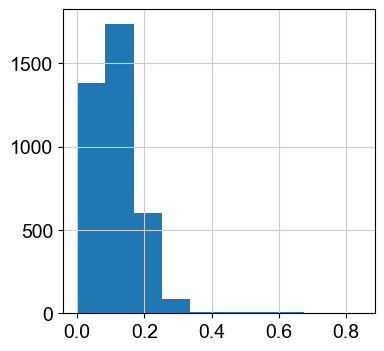

In [34]:
plt.hist(adata[:,"Map3k2"].X.A)

In [35]:
markers=['Gm10639','Gsta1','Krt19','Plaur','Nefl','Nefm','Ccdc73','Areg','Aspm','Nusap1','Kif14','Fam83d','Gsta2','Itgb3','Timp3','Gsta4','Tmc3','Postn','Cmah','Heyl','Tinagl1','Slc16a11','Plscr2','Alcam','Bgn','Mgp','Col6a2','Grem1','Mest','Btbd17','Svbp','Zbtb18','Myl4','Myh3','Tnnc1','Itgb1bp2']

In [36]:
adata.obs.leiden=adata.obs.leiden.cat.reorder_categories(['7','5','2','6','3','9','1','8','4'])

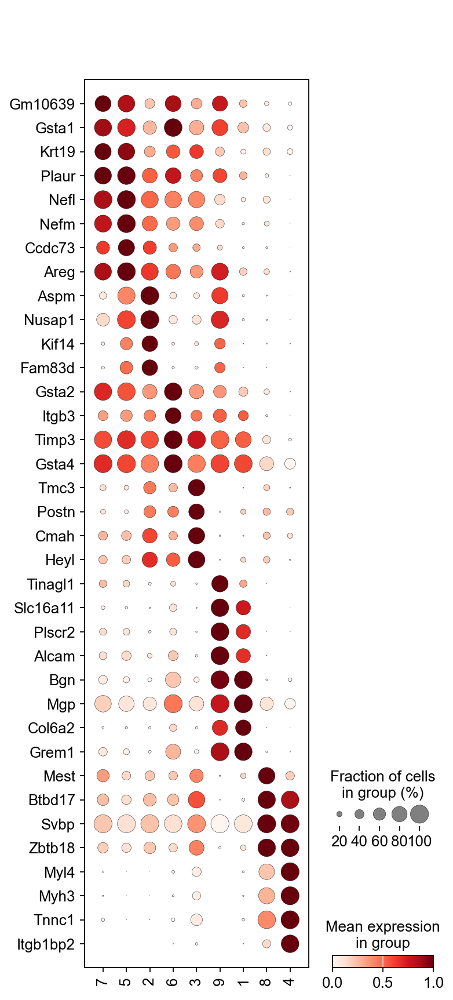

In [37]:
sc.set_figure_params(dpi_save=600)
sc.pl.dotplot(adata,markers,groupby="leiden",swap_axes=True,dendrogram=False,standard_scale="var",save="diffexpr.png")

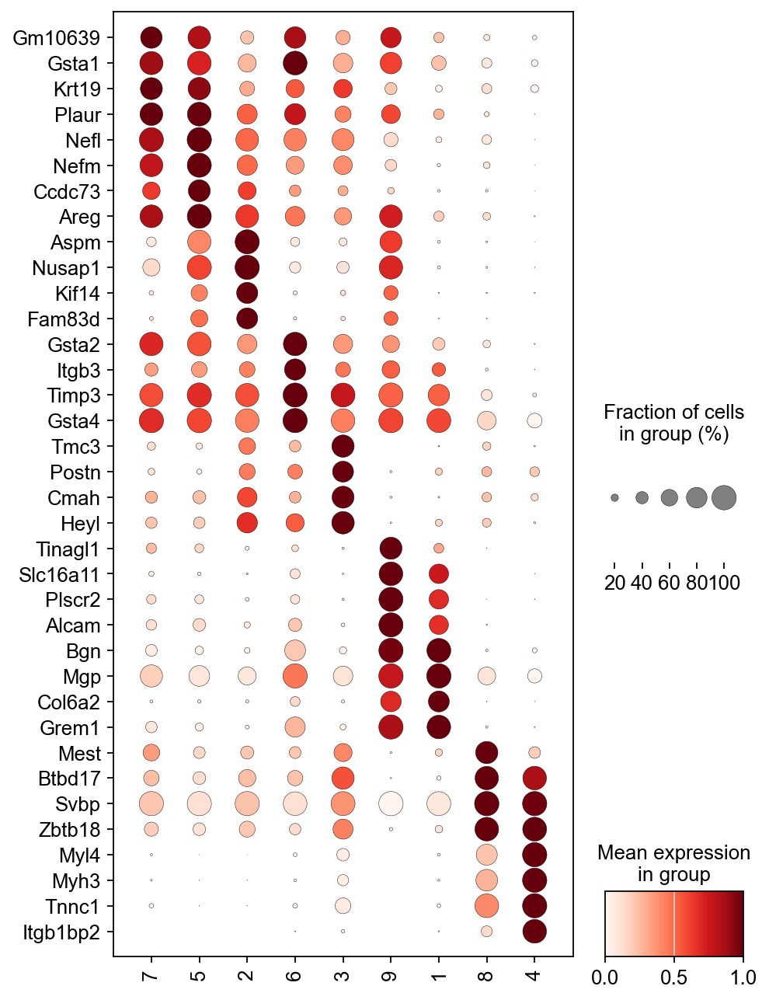

In [38]:
sc.set_figure_params(dpi_save=600)
sc.pl.dotplot(adata,markers,groupby="leiden",swap_axes=True,dendrogram=False,standard_scale="var",save="diffexpr.png",figsize=(6.5,10))

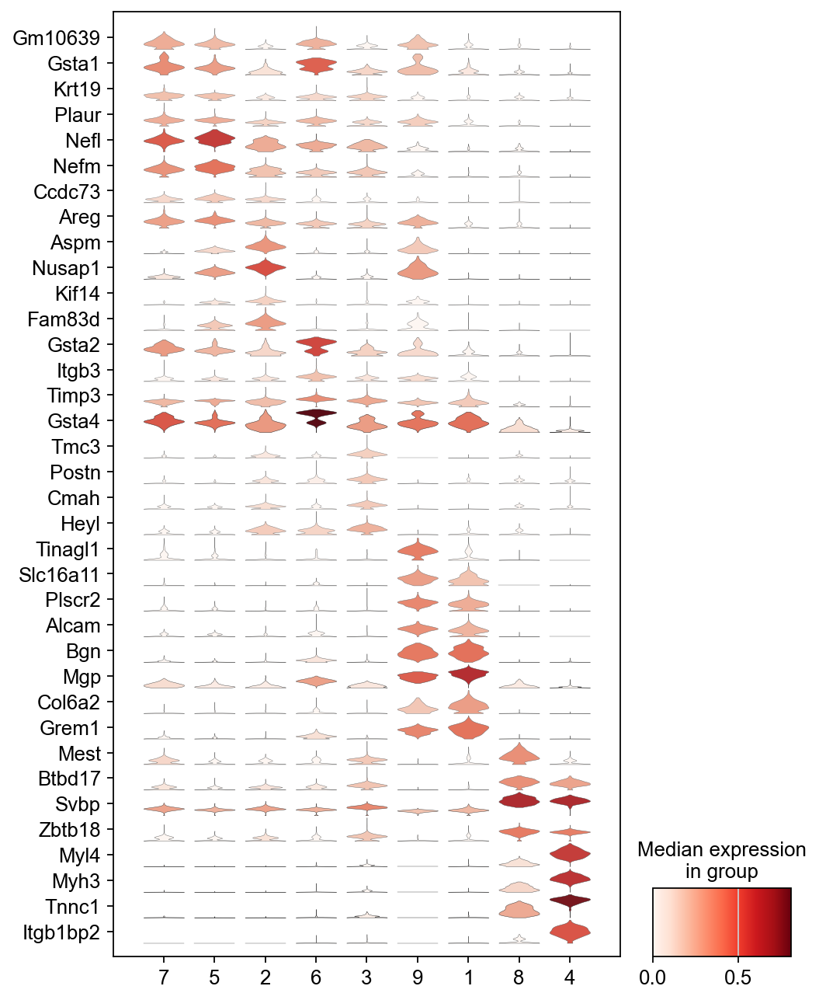

In [39]:
sc.pl.stacked_violin(adata, markers, 'leiden', dendrogram=False,standard_scale="var",swap_axes=True,figsize=(7,10),cmap="Reds")

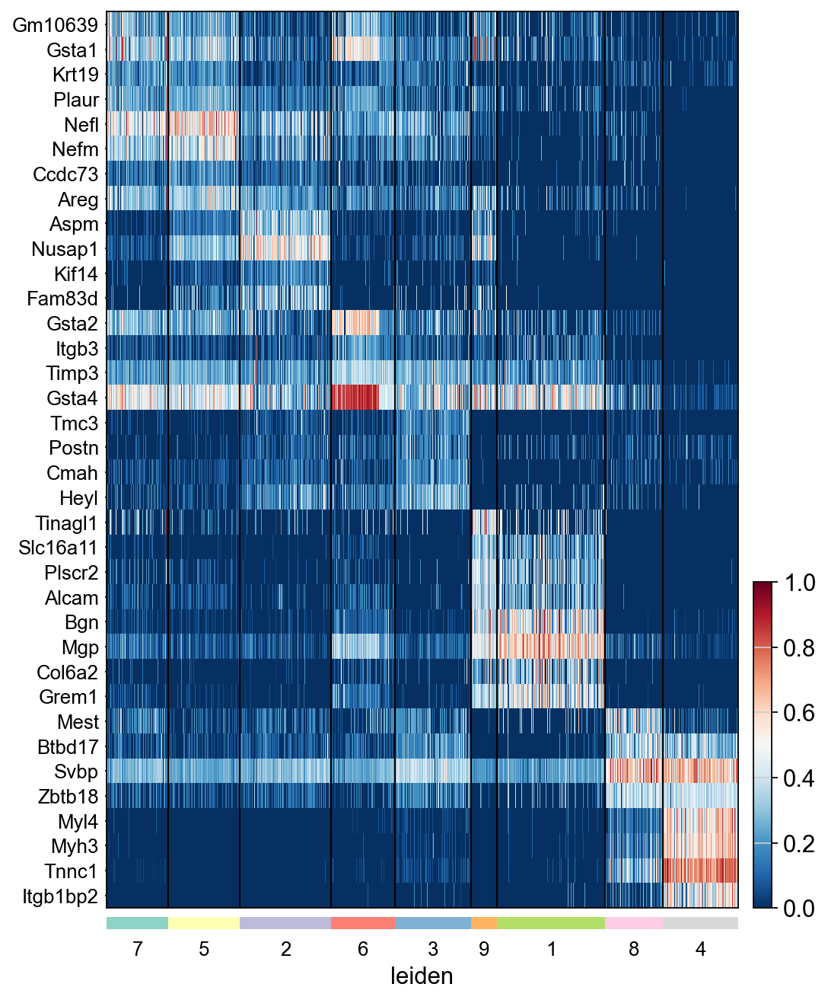

In [40]:
sc.pl.heatmap(adata, markers, groupby='leiden',standard_scale="var", cmap='RdBu_r', swap_axes=True,figsize=(7,10))

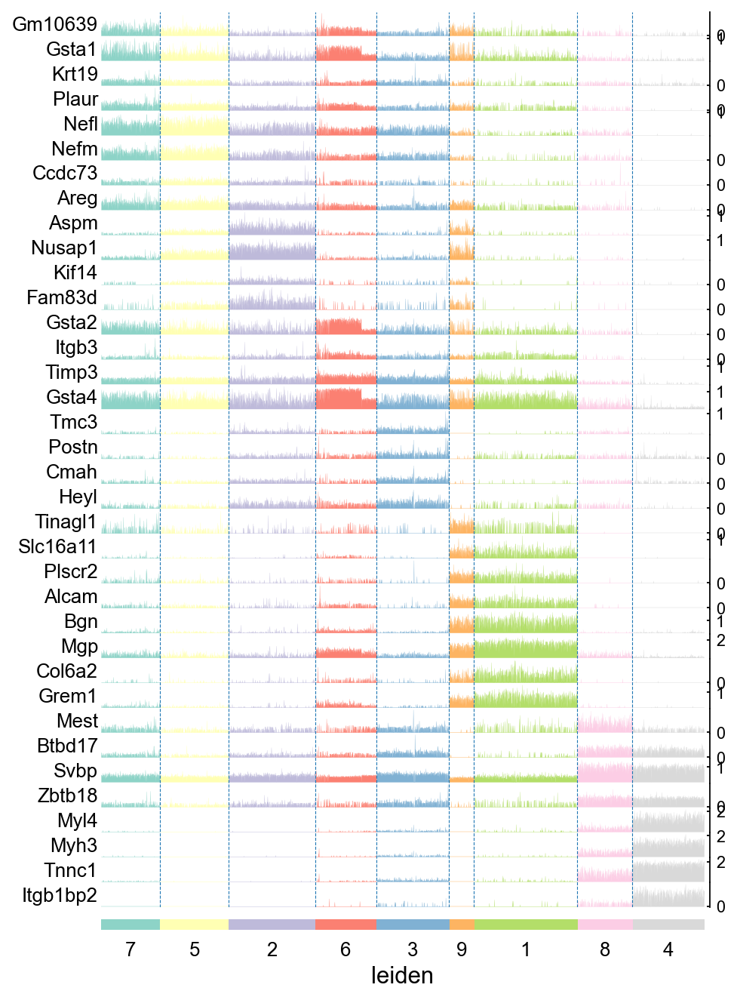

In [41]:
sc.pl.tracksplot(adata, markers, groupby='leiden',figsize=(7,10))

In [42]:
sc.pp.scale(adata)

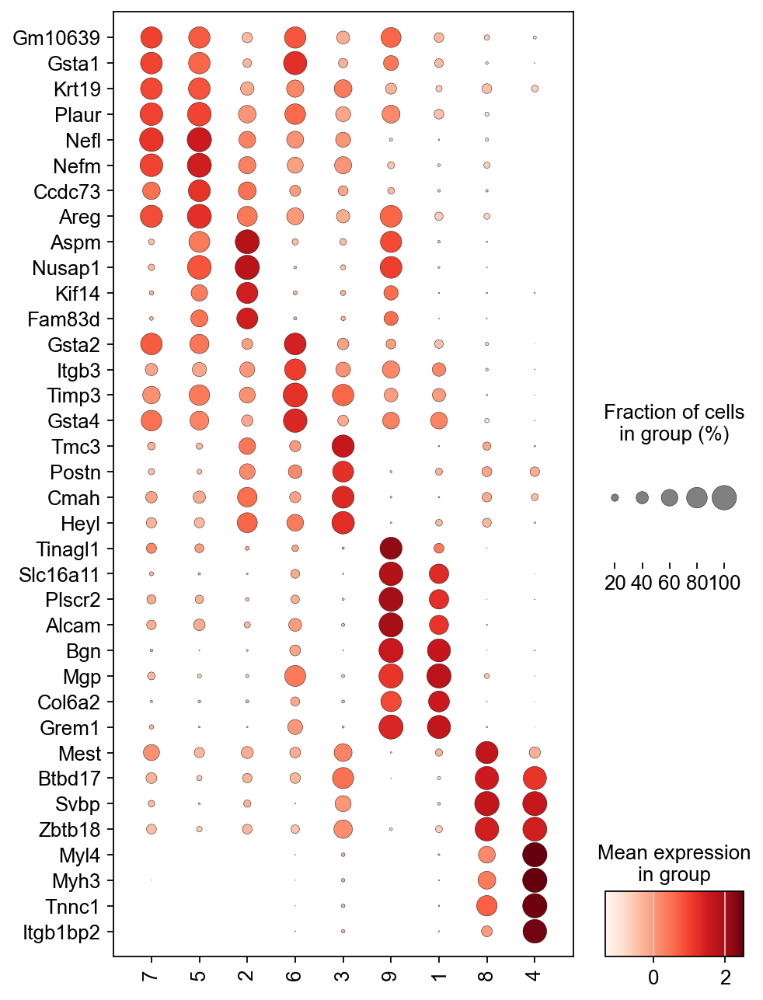

In [43]:
sc.set_figure_params(dpi_save=600)
sc.pl.dotplot(adata,markers,groupby="leiden",swap_axes=True,dendrogram=False,save="diffexpr.png",figsize=(6.5,10))

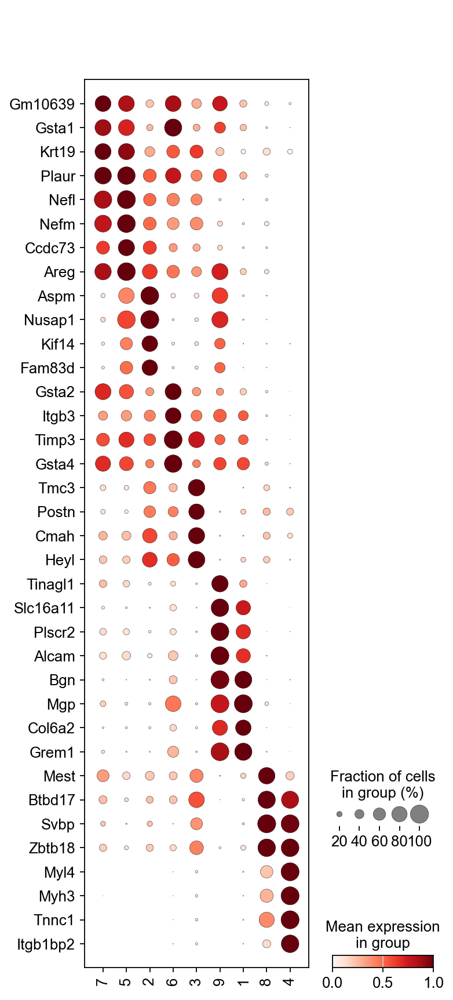

In [44]:
sc.set_figure_params(dpi_save=600)
sc.pl.dotplot(adata,markers,groupby="leiden",swap_axes=True,dendrogram=False,standard_scale="var",save="diffexpr_2.png")

In [45]:
g=adata.obs.groupby(["leiden","condition"])

In [46]:
prop=pd.concat(list(map(lambda x: g.size().loc[x]/g.size().loc[x].sum(),['7','5','2','6','3','9','1','8','4'])),axis=1)

In [47]:
prop.columns=['7','5','2','6','3','9','1','8','4']

In [48]:
prop.loc["hard"]

7    0.529412
5    0.687356
2    0.425725
6    0.314433
3    0.585683
9    0.822785
1    0.511450
8    0.455840
4    0.564835
Name: hard, dtype: float64

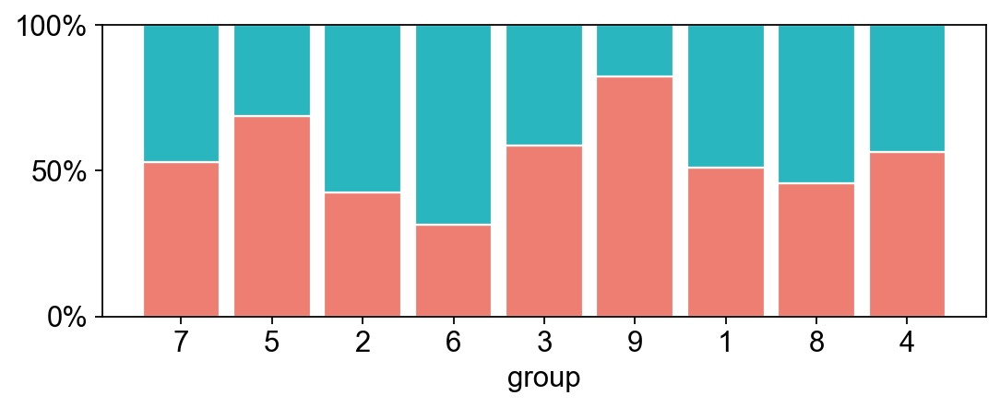

In [49]:

# Data
r = ['7','5','2','6','3','9','1','8','4']
raw_data = {'greenBars': [20, 1.5, 7, 10, 5], 'orangeBars': [5, 15, 5, 10, 15],'blueBars': [2, 15, 18, 5, 10]}
df = pd.DataFrame(raw_data)
 
# From raw value to percentage
totals = np.ones(9)
greenBars = prop.loc["hard"].values
orangeBars = prop.loc["soft"].values

 
# plot
barWidth = 0.85
names =['7','5','2','6','3','9','1','8','4']
plt.figure(figsize=(7,3))
# Create green Bars
plt.bar(r, greenBars, color='#EE7D72', edgecolor='white', width=barWidth)
# Create orange Bars
plt.bar(r, orangeBars, bottom=greenBars, color='#2AB6BE', edgecolor='white', width=barWidth)
#plt.xlim(-0.5,len(names)-.5)
plt.ylim(0,1)
# Custom x axis
plt.xticks(r, names)
plt.yticks(ticks=[0,0.5,1],labels=["0%","50%","100%"])
plt.xlabel("group")
plt.grid(False)
# Show graphic
plt.tight_layout()
plt.savefig("figures/barplot.png")